In [576]:
from PIL import Image, ImageSequence
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

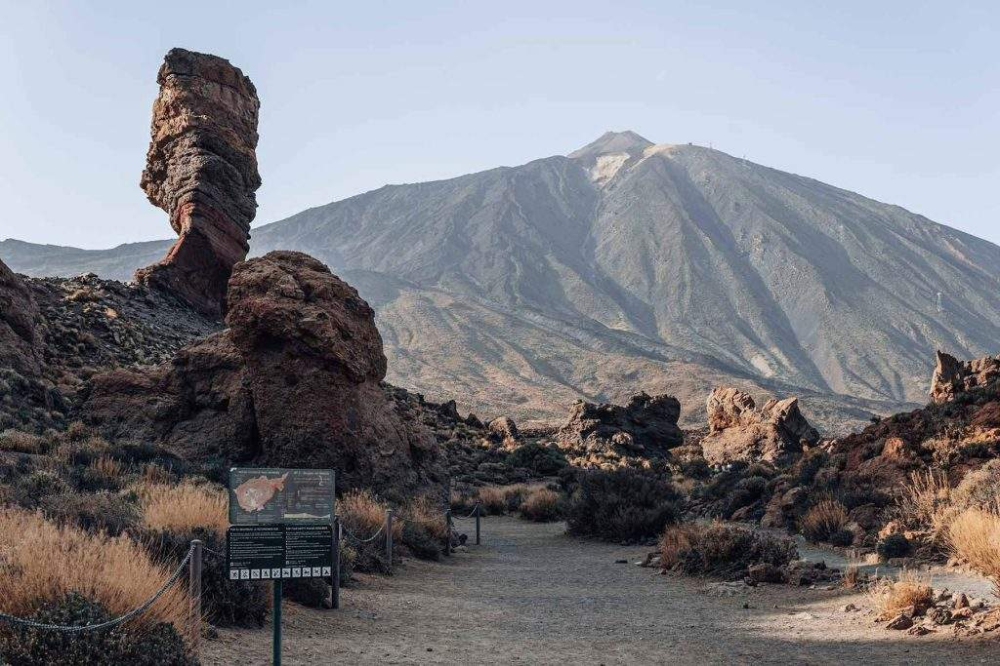

In [577]:
# Cargar la imagen fondo
fondo = Image.open('images/fondo.jpg').convert("RGBA")
display(fondo)

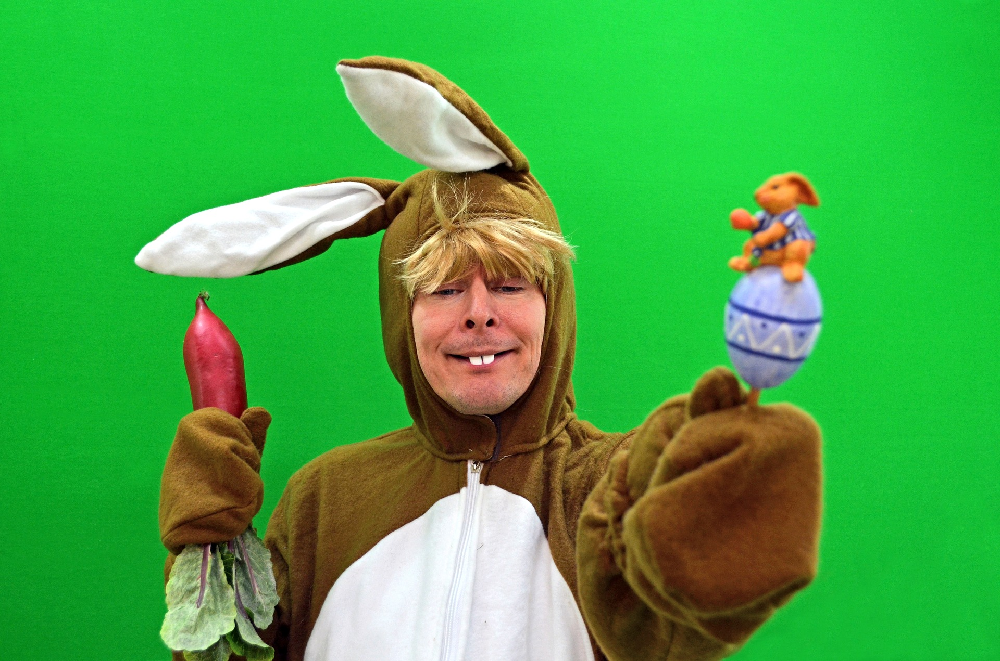

In [578]:
# Cargar la imagen conejo
conejo = Image.open('images/conejo.jpg').convert("RGBA")
display(conejo)

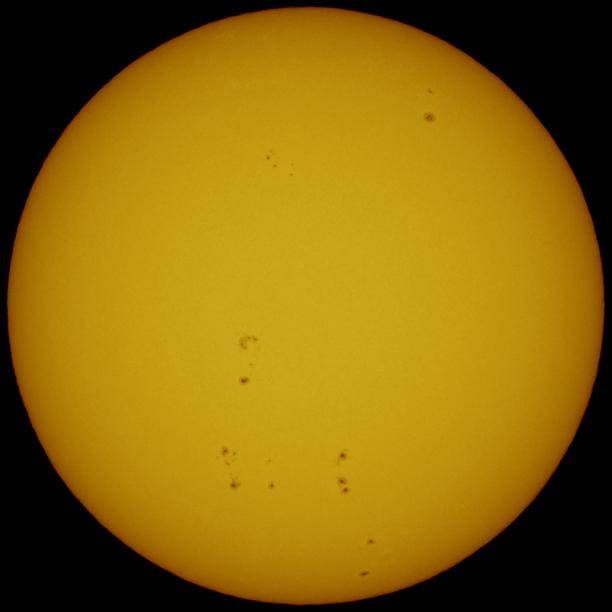

In [579]:
# Cargar la imagen conejo
sol = Image.open('images/sol_JRA.jpg').convert("RGBA")
display(sol)

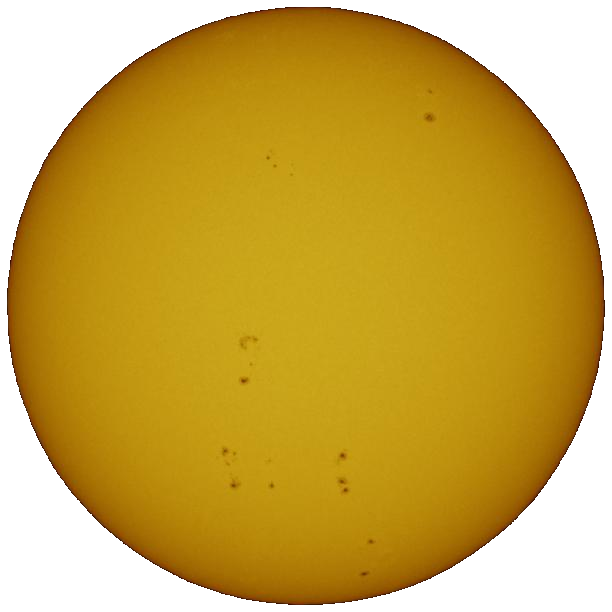

In [580]:
# Eliminamos el fondo negro
sol_np = np.array(sol)
r, g, b, a = sol_np[:, :, 0], sol_np[:, :, 1], sol_np[:, :, 2], sol_np[:, :, 3]

# Crear una máscara para el fondo negro
mask = (r < 50) & (g < 50) & (b < 50)  # Puedes ajustar el umbral según sea necesario

# Establecer el color transparente para los píxeles que son negros
sol_np[mask] = [255, 255, 255, 0]  # Fondo transparente

sol_sin_fondo = Image.fromarray(sol_np)

display(sol_sin_fondo)

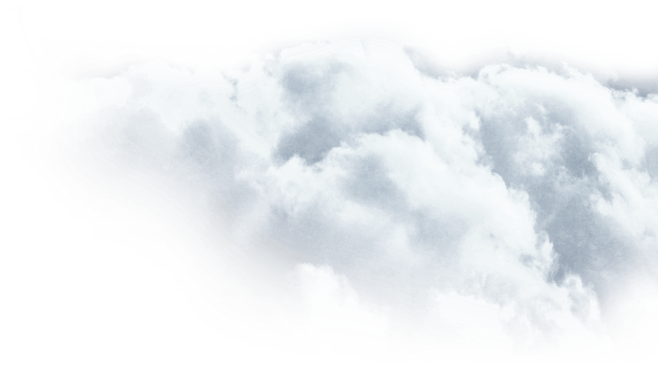

In [581]:
# Cargar la imagen conejo
nube = Image.open('images/nube.png').convert("RGBA")
display(nube)

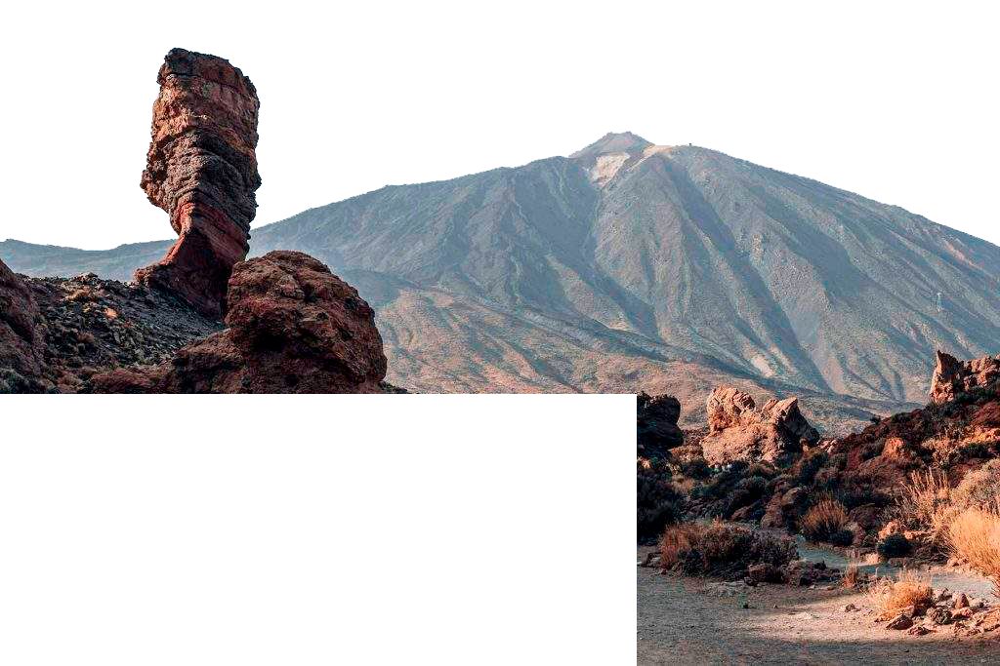

In [582]:
# Cargar la imagen sol
fondoRecortado = Image.open('images/fondoRecortado2.png').convert("RGBA")
display(fondoRecortado)

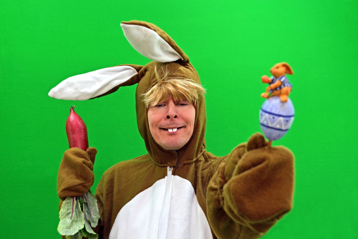

In [583]:
# Redimensionamos el conejo
conejoEscalado = Image.open('images/conejo.jpg').resize((int(fondo.width * 0.35), int(fondo.height * 0.35))).convert("RGBA")
display(conejoEscalado)

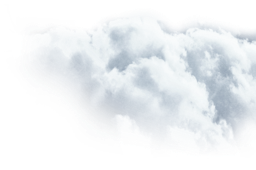

In [584]:
# Redimensionamos la nube
nubeEscalada = Image.open('images/nube.png').resize((int(fondo.width * 0.25), int(fondo.height * 0.25))).convert("RGBA")
display(nubeEscalada)

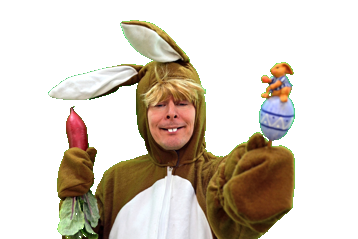

In [585]:
# Eliminamos el fondo verde (Chroma key)
conejo_np = np.array(conejoEscalado)
r, g, b, a = conejo_np[:, :, 0], conejo_np[:, :, 1], conejo_np[:, :, 2], conejo_np[:, :, 3]
mask = (g > 120) & (r < 100) & (b < 100)

conejo_np[mask] = [255, 255, 255, 0]  # Fondo transparente para la máscara verde
conejoSinFondo = Image.fromarray(conejo_np)
display(conejoSinFondo)

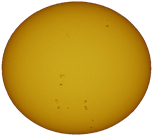

In [586]:
# Redimensionamos el sol para que se ajuste al fondo
solRecortado = sol_sin_fondo.resize((int(fondo.size[0] * 0.15), int(fondo.size[1] * 0.2)))
display(solRecortado)

In [587]:
fondo.size

(1024, 683)

In [588]:
# Parámetros de la animación
num_frames = 20
desplazamiento_conejo = 20  # Distancia de movimiento del conejo
desplazamiento_sol_x = 15   # Movimiento en diagonal en x para el sol
desplazamiento_sol_y = -15  # Movimiento en diagonal en y para el sol
desplazamiento_nube = 100  # Desplazamiento horizontal de la nube

In [589]:
# Posiciones iniciales
x_conejo, y_conejo = 100, 500
x_sol, y_sol = 900, 10
x_nube, y_nube = 0, 60  # Posición inicial de la nube

In [590]:
# Crear la lista de frames
frames = []

for i in range(num_frames):
    # Crear un frame con fondo transparente
    frame = Image.new("RGBA", fondo.size)
    frame.paste(fondo, (0, 0))

    # Animación del conejo (moviéndose hacia abajo y hacia arriba)
    if i < num_frames // 2:
        y_conejo_actual = y_conejo + (i % (num_frames // 2)) * desplazamiento_conejo  # Movimiento hacia abajo
    else:
        y_conejo_actual = y_conejo + ((num_frames // 2) - (i % (num_frames // 2))) * desplazamiento_conejo  # Movimiento hacia arriba
    frame.paste(conejoSinFondo, (x_conejo, y_conejo_actual), conejoSinFondo)

    # Animación del sol (movimiento diagonal)
    if i < num_frames // 2:
        # Primera mitad: movimiento hacia la esquina superior derecha
        x_sol_actual = x_sol + i * desplazamiento_sol_x
        y_sol_actual = y_sol + i * desplazamiento_sol_y
    else:
        # Segunda mitad: movimiento de regreso a la posición inicial
        x_sol_actual = x_sol + (num_frames - i - 1) * desplazamiento_sol_x
        y_sol_actual = y_sol + (num_frames - i - 1) * desplazamiento_sol_y
    frame.paste(solRecortado, (int(x_sol_actual), int(y_sol_actual)), solRecortado)


     # Animación de la nube (movimiento horizontal de ida y vuelta)
    if i < num_frames // 2:
        x_nube_actual = x_nube + i * desplazamiento_nube
    else:
        x_nube_actual = x_nube + (num_frames - i - 1) * desplazamiento_nube
    frame.paste(nubeEscalada, (int(x_nube_actual), y_nube), nubeEscalada)
    
    # Colocar fondoRecortado encima de la nube
    frame.paste(fondoRecortado, (0, 0), fondoRecortado)

    # Agregar el frame a la lista de frames
    frames.append(frame)

# Guardar la animación como GIF en el directorio actual
frames[0].save("images/animacion.gif", save_all=True, append_images=frames[1:], duration=100, loop=0)